# Teaching a Computer to Color Old Photos!

Today we're going to build a **GAN** (Generative Adversarial Network) that takes black-and-white photos and turns them into color photos.

A GAN is like a game between two neural networks:
- **The Generator (the Artist):** tries to color the photo
- **The Discriminator (the Critic):** tries to tell if a photo is real or fake

They both get better by competing with each other!

---

## Step 1: Download the Dataset

We'll use the **TF Flowers** dataset — about 3,670 photos of 5 kinds of flowers. Flowers are great for colorization because they have **bright, varied colors** (red roses, yellow sunflowers, purple tulips...) that the GAN can learn.

The first time you run this cell it downloads ~220 MB. After that it's cached on disk.

TensorFlow version: 2.20.0
GPUs visible to TensorFlow: []
Dataset directory: /Users/hnaja002/.keras/datasets/flower_photos
Found 3670 flower images across 1 classes: ['flower_photos']


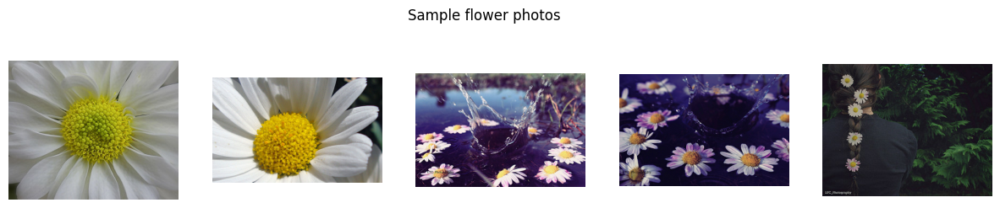

In [1]:
import os, pathlib, tarfile
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt

tf.random.set_seed(42)
np.random.seed(42)

print('TensorFlow version:', tf.__version__)
print('GPUs visible to TensorFlow:', tf.config.list_physical_devices('GPU'))

# Download the flowers archive (cached on disk after the first run)
URL = 'https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz'
archive_path = pathlib.Path(tf.keras.utils.get_file('flower_photos.tgz', origin=URL))
extract_root = archive_path.parent
data_dir     = extract_root / 'flower_photos'

# Extract it ourselves so we don't depend on Keras's `untar`/`extract` flag,
# which behaves differently across TF versions and silently leaves the .tgz unpacked.
if not data_dir.is_dir():
    print('Extracting...')
    with tarfile.open(archive_path, 'r:gz') as tar:
        tar.extractall(extract_root)
print('Dataset directory:', data_dir)

# rglob picks up the photos no matter how the archive is laid out
image_paths = sorted(str(p) for p in data_dir.rglob('*.jpg'))
classes = sorted(d.name for d in data_dir.iterdir() if d.is_dir())
print(f'Found {len(image_paths)} flower images across {len(classes)} classes: {classes}')

assert len(image_paths) > 0, (
    f'No images found under {data_dir}. '
    f'Top-level contents: {list(data_dir.iterdir()) if data_dir.exists() else "(missing)"}'
)

# Show a few originals
fig, axes = plt.subplots(1, 5, figsize=(15, 3))
for ax, p in zip(axes, image_paths[:5]):
    img = tf.io.decode_jpeg(tf.io.read_file(p)).numpy()
    ax.imshow(img); ax.axis('off')
fig.suptitle('Sample flower photos')
plt.show()

---

## Step 2: Preprocess the Data

We need pairs of images: a **black-and-white version (input)** and the **original color version (target)**.

Steps:
1. Read each JPEG and **resize** to 128×128 so every photo is the same size.
2. Make a grayscale copy using the standard luminance formula `0.299·R + 0.587·G + 0.114·B` — that matches how your eyes perceive brightness.
3. Scale pixels from `[0, 255]` to `[-1, 1]`. Neural networks learn better with small numbers centered around zero.
4. Hold out ~10% of the photos as a **test set** the model never trains on.
5. Build an efficient `tf.data` pipeline that loads, shuffles, and batches images on the fly.

Training images: 3303   Test images: 367


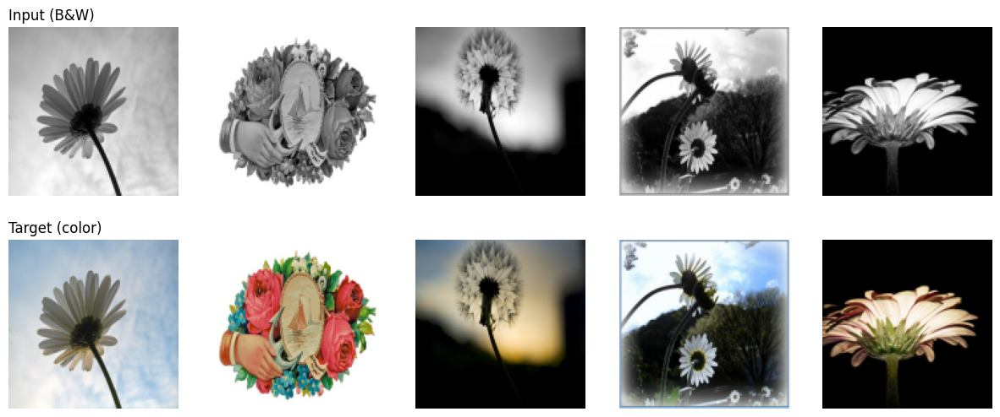

In [2]:
IMG_SIZE   = 128
BATCH_SIZE = 32

all_paths = sorted(image_paths)
rng = np.random.RandomState(42)
rng.shuffle(all_paths)
split = int(0.9 * len(all_paths))
train_paths, test_paths = all_paths[:split], all_paths[split:]
print(f'Training images: {len(train_paths)}   Test images: {len(test_paths)}')

def load_pair(path):
    raw = tf.io.read_file(path)
    img = tf.io.decode_jpeg(raw, channels=3)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE), method='area')
    img = tf.cast(img, tf.float32)

    # Grayscale via the luminance formula (matches human perception of brightness)
    gray = (0.299 * img[..., 0:1] + 0.587 * img[..., 1:2] + 0.114 * img[..., 2:3])

    # Scale to [-1, 1]
    gray  = (gray  / 127.5) - 1.0
    color = (img   / 127.5) - 1.0
    return gray, color

def make_dataset(paths, training):
    ds = tf.data.Dataset.from_tensor_slices(paths)
    if training:
        ds = ds.shuffle(2048, reshuffle_each_iteration=True)
    ds = ds.map(load_pair, num_parallel_calls=tf.data.AUTOTUNE)
    if training:
        # Light data augmentation: random horizontal flip on the PAIR
        def flip(g, c):
            do = tf.random.uniform([]) > 0.5
            g = tf.cond(do, lambda: tf.image.flip_left_right(g), lambda: g)
            c = tf.cond(do, lambda: tf.image.flip_left_right(c), lambda: c)
            return g, c
        ds = ds.map(flip, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    return ds

train_ds = make_dataset(train_paths, training=True)
test_ds  = make_dataset(test_paths,  training=False)

# Show a few B&W ↔ color pairs so the students can see what the network sees
gray_sample, color_sample = next(iter(train_ds))
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
for i in range(5):
    axes[0, i].imshow((gray_sample[i, :, :, 0].numpy() + 1) / 2, cmap='gray')
    axes[0, i].axis('off')
    axes[1, i].imshow((color_sample[i].numpy() + 1) / 2)
    axes[1, i].axis('off')
axes[0, 0].set_title('Input (B&W)',  loc='left')
axes[1, 0].set_title('Target (color)', loc='left')
plt.show()

---

## Step 3: Build and Train the GAN

**The Generator** is a **U-Net** — it shrinks the photo down through several layers to figure out *what's in it* (a petal, a leaf, sky...), then grows it back up while painting in colors. The **skip connections** (the dashed shortcuts in U-Net diagrams) carry fine detail from the early layers all the way to the output so the painting stays sharp.

**The Discriminator** is a **PatchGAN** — instead of judging the whole image with one yes/no, it looks at many small patches and judges each one. That makes it pay attention to local details like edges and textures.

**The losses:**
- The generator wants to **fool** the critic AND make pixels close to the real photo (L1 loss).
- The discriminator wants to **catch** the fakes.

We train ~30 epochs. On a GPU this is roughly 8–10 minutes.

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)          ┃ Output Shape      ┃     Param # ┃ Connected to       ┃
┡━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━┩
│ input_layer           │ (None, 128, 128,  │           0 │ -                  │
│ (InputLayer)          │ 1)                │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential            │ (None, 64, 64,    │       1,024 │ input_layer[0][0]  │
│ (Sequential)          │ 64)               │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential_1          │ (None, 32, 32,    │     131,584 │ sequential[0][0]   │
│ (Sequential)          │ 128)              │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential_2          │ (None, 16, 16,    │     525,312 │ sequential_1[0][0] │
│ (Sequential)          │ 256)              │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential_3          │ (None, 8, 8, 512) │   2,099,200 │ sequential_2[0][0] │
│ (Sequential)          │                   │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential_4          │ (None, 4, 4, 512) │   4,196,352 │ sequential_3[0][0] │
│ (Sequential)          │                   │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential_5          │ (None, 2, 2, 512) │   4,196,352 │ sequential_4[0][0] │
│ (Sequential)          │                   │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential_6          │ (None, 4, 4, 512) │   4,196,352 │ sequential_5[0][0] │
│ (Sequential)          │                   │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ concatenate           │ (None, 4, 4,      │           0 │ sequential_6[0][0… │
│ (Concatenate)         │ 1024)             │             │ sequential_4[0][0] │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential_7          │ (None, 8, 8, 512) │   8,390,656 │ concatenate[0][0]  │
│ (Sequential)          │                   │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ concatenate_1         │ (None, 8, 8,      │           0 │ sequential_7[0][0… │
│ (Concatenate)         │ 1024)             │             │ sequential_3[0][0] │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential_8          │ (None, 16, 16,    │   4,195,328 │ concatenate_1[0][… │
│ (Sequential)          │ 256)              │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ concatenate_2         │ (None, 16, 16,    │           0 │ sequential_8[0][0… │
│ (Concatenate)         │ 512)              │             │ sequential_2[0][0] │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential_9          │ (None, 32, 32,    │   1,049,088 │ concatenate_2[0][… │
│ (Sequential)          │ 128)              │             │                    │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ concatenate_3         │ (None, 32, 32,    │           0 │ sequential_9[0][0… │
│ (Concatenate)         │ 256)              │             │ sequential_1[0][0] │
├───────────────────────┼───────────────────┼─────────────┼────────────────────┤
│ sequential_10         │ (None, 64, 64,    │     262,400 │ concatenate_3[0][… │
│ (Sequential)          │ 64)  

 Total params: 29,249,795 (111.58 MB)

 Trainable params: 29,243,011 (111.55 MB)

 Non-trainable params: 6,784 (26.50 KB)

2026-05-12 20:43:37.224500: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch  1/30  G=25.189  D=0.889  L1=0.237  (189.8s)


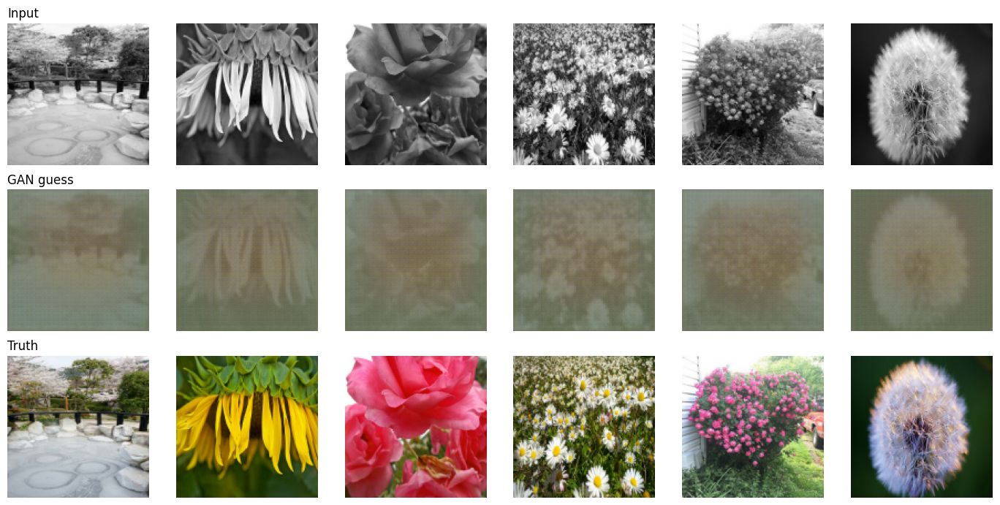

2026-05-12 20:46:48.746350: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch  2/30  G=21.839  D=0.826  L1=0.202  (191.3s)
Epoch  3/30  G=21.625  D=0.860  L1=0.200  (191.3s)


2026-05-12 20:53:11.546496: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch  4/30  G=21.264  D=0.894  L1=0.197  (191.5s)
Epoch  5/30  G=21.165  D=0.915  L1=0.197  (193.0s)


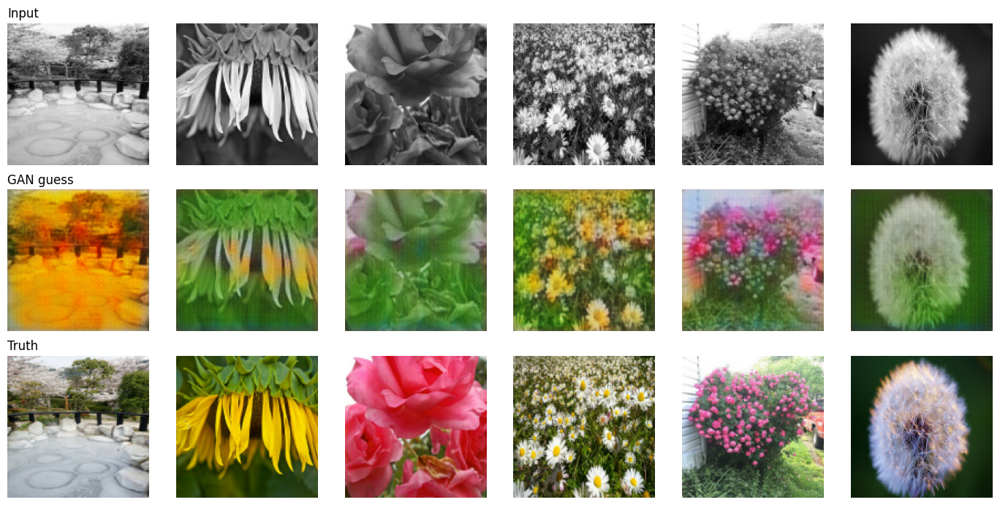

Epoch  6/30  G=21.032  D=0.877  L1=0.195  (192.3s)
Epoch  7/30  G=20.575  D=0.944  L1=0.191  (195.8s)


2026-05-12 21:06:13.392773: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch  8/30  G=20.215  D=0.943  L1=0.188  (200.6s)
Epoch  9/30  G=19.707  D=0.991  L1=0.183  (194.4s)
Epoch 10/30  G=19.223  D=0.980  L1=0.179  (197.6s)


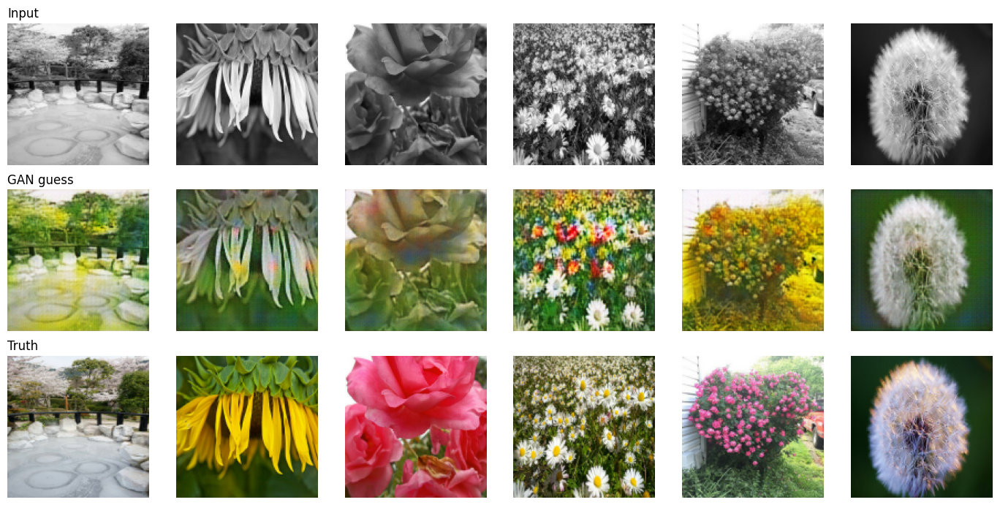

Epoch 11/30  G=19.045  D=0.981  L1=0.177  (202.3s)
Epoch 12/30  G=18.510  D=0.986  L1=0.172  (201.0s)
Epoch 13/30  G=18.013  D=1.012  L1=0.167  (195.3s)
Epoch 14/30  G=17.668  D=1.037  L1=0.164  (199.4s)
Epoch 15/30  G=17.277  D=1.057  L1=0.160  (205.2s)


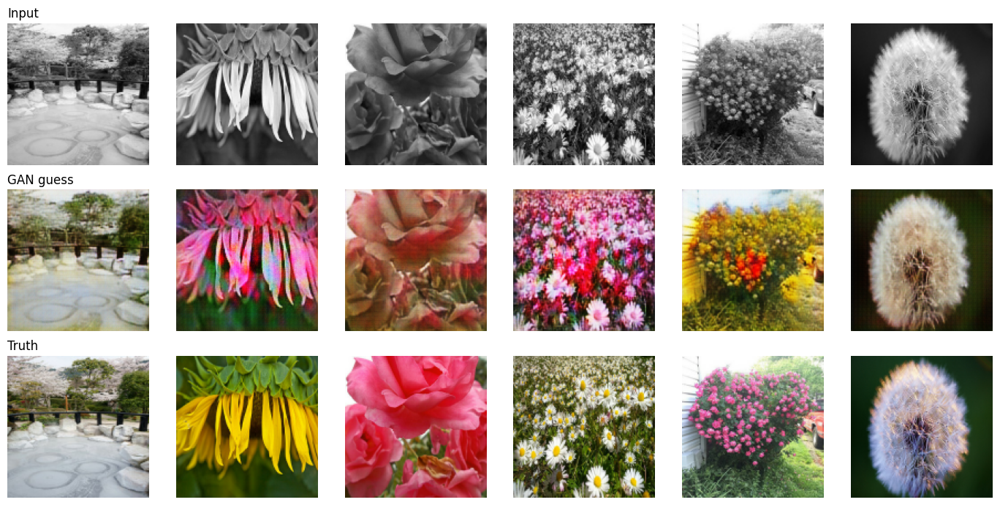

2026-05-12 21:32:49.499556: I tensorflow/core/framework/local_rendezvous.cc:407] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Epoch 16/30  G=16.766  D=0.993  L1=0.155  (200.3s)
Epoch 17/30  G=16.518  D=1.056  L1=0.153  (201.0s)
Epoch 18/30  G=16.063  D=1.033  L1=0.148  (202.4s)
Epoch 19/30  G=15.818  D=1.066  L1=0.146  (202.9s)
Epoch 20/30  G=15.339  D=1.076  L1=0.141  (208.3s)


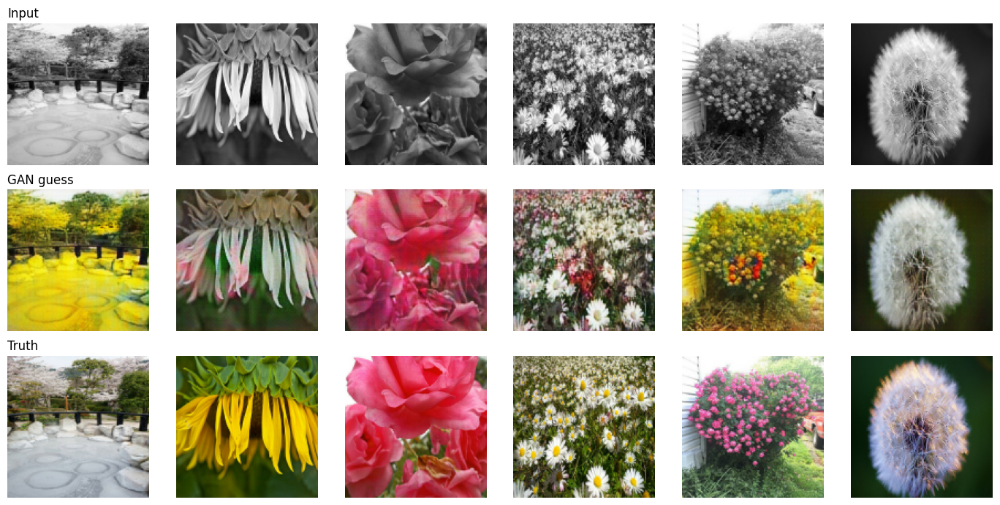

Epoch 21/30  G=15.225  D=1.057  L1=0.140  (201.7s)
Epoch 22/30  G=14.934  D=1.100  L1=0.137  (205.4s)
Epoch 23/30  G=14.649  D=1.066  L1=0.135  (201.0s)
Epoch 24/30  G=14.408  D=1.080  L1=0.132  (199.9s)
Epoch 25/30  G=14.070  D=1.096  L1=0.129  (203.0s)


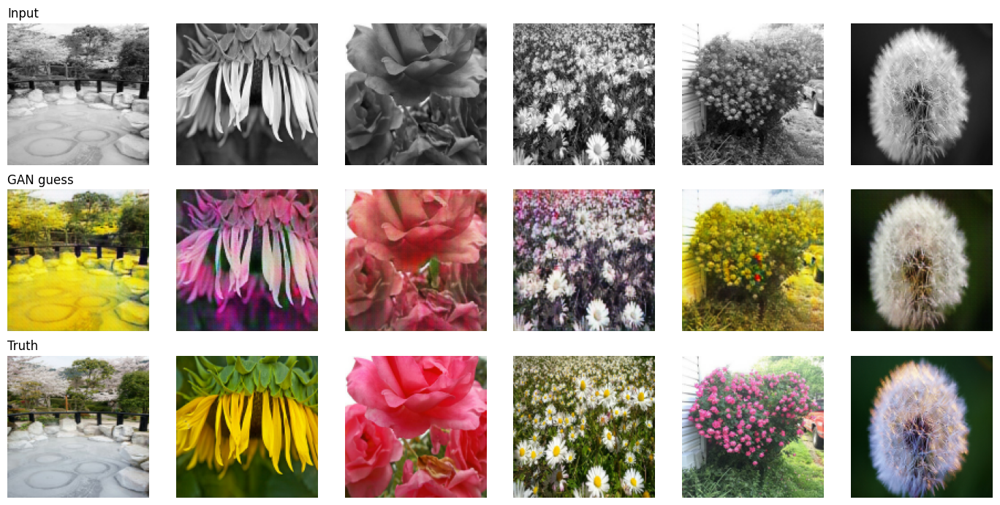

Epoch 26/30  G=13.984  D=1.076  L1=0.128  (200.2s)
Epoch 27/30  G=13.846  D=1.104  L1=0.127  (202.9s)
Epoch 28/30  G=13.630  D=1.095  L1=0.125  (226.0s)
Epoch 29/30  G=13.257  D=1.118  L1=0.121  (227.5s)
Epoch 30/30  G=13.194  D=1.065  L1=0.120  (225.1s)


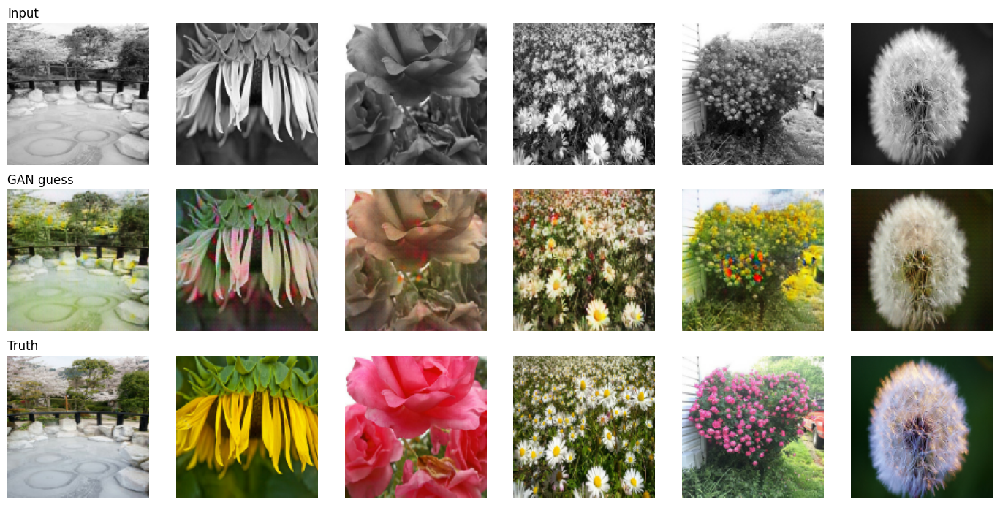

Training done!


In [3]:
def downsample(filters, size=4, apply_bn=True):
    block = tf.keras.Sequential()
    block.add(layers.Conv2D(filters, size, strides=2, padding='same',
                            kernel_initializer=tf.random_normal_initializer(0., 0.02),
                            use_bias=False))
    if apply_bn:
        block.add(layers.BatchNormalization())
    block.add(layers.LeakyReLU(0.2))
    return block

def upsample(filters, size=4, apply_dropout=False):
    block = tf.keras.Sequential()
    block.add(layers.Conv2DTranspose(filters, size, strides=2, padding='same',
                                     kernel_initializer=tf.random_normal_initializer(0., 0.02),
                                     use_bias=False))
    block.add(layers.BatchNormalization())
    if apply_dropout:
        block.add(layers.Dropout(0.5))
    block.add(layers.ReLU())
    return block

def build_generator():
    inputs = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 1))

    # Encoder: 128 -> 64 -> 32 -> 16 -> 8 -> 4 -> 2
    down_stack = [
        downsample(64,  apply_bn=False),  # 64x64
        downsample(128),                  # 32x32
        downsample(256),                  # 16x16
        downsample(512),                  # 8x8
        downsample(512),                  # 4x4
        downsample(512),                  # 2x2
    ]

    # Decoder: 2 -> 4 -> 8 -> 16 -> 32 -> 64
    up_stack = [
        upsample(512, apply_dropout=True),  # 4x4
        upsample(512, apply_dropout=True),  # 8x8
        upsample(256),                      # 16x16
        upsample(128),                      # 32x32
        upsample(64),                       # 64x64
    ]

    last = layers.Conv2DTranspose(3, 4, strides=2, padding='same',
                                  kernel_initializer=tf.random_normal_initializer(0., 0.02),
                                  activation='tanh')  # -> 128x128, pixels in [-1, 1]

    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = list(reversed(skips[:-1]))  # all but the bottleneck, in reverse order

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = layers.Concatenate()([x, skip])

    x = last(x)
    return tf.keras.Model(inputs, x, name='generator')

def build_discriminator():
    # PatchGAN: looks at (grayscale input, color image) -> map of real/fake scores
    gray  = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 1), name='gray')
    color = layers.Input(shape=(IMG_SIZE, IMG_SIZE, 3), name='color')
    x = layers.Concatenate()([gray, color])           # 128x128x4
    x = downsample(64,  apply_bn=False)(x)            # 64x64
    x = downsample(128)(x)                            # 32x32
    x = downsample(256)(x)                            # 16x16
    x = layers.ZeroPadding2D()(x)
    x = layers.Conv2D(512, 4, strides=1,
                      kernel_initializer=tf.random_normal_initializer(0., 0.02),
                      use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    x = layers.ZeroPadding2D()(x)
    out = layers.Conv2D(1, 4, strides=1,
                        kernel_initializer=tf.random_normal_initializer(0., 0.02))(x)
    return tf.keras.Model([gray, color], out, name='discriminator')

generator     = build_generator()
discriminator = build_discriminator()
generator.summary(line_length=80)

bce      = tf.keras.losses.BinaryCrossentropy(from_logits=True)
gen_opt  = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
disc_opt = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
L1_WEIGHT = 100.0  # makes the generator really care about matching true colors

@tf.function
def train_step(gray, real_color):
    with tf.GradientTape() as gtape, tf.GradientTape() as dtape:
        fake_color = generator(gray, training=True)

        d_real = discriminator([gray, real_color], training=True)
        d_fake = discriminator([gray, fake_color], training=True)

        d_loss = bce(tf.ones_like(d_real),  d_real) + \
                 bce(tf.zeros_like(d_fake), d_fake)

        g_adv = bce(tf.ones_like(d_fake), d_fake)
        g_l1  = tf.reduce_mean(tf.abs(real_color - fake_color))
        g_loss = g_adv + L1_WEIGHT * g_l1

    g_grads = gtape.gradient(g_loss, generator.trainable_variables)
    d_grads = dtape.gradient(d_loss, discriminator.trainable_variables)
    gen_opt.apply_gradients(zip(g_grads, generator.trainable_variables))
    disc_opt.apply_gradients(zip(d_grads, discriminator.trainable_variables))
    return g_loss, d_loss, g_l1

# Save one fixed test batch so we can watch the model improve over time
fixed_gray, fixed_color = next(iter(test_ds))
fixed_gray  = fixed_gray[:6]
fixed_color = fixed_color[:6]

def preview():
    pred = generator(fixed_gray, training=False).numpy()
    fig, axes = plt.subplots(3, 6, figsize=(14, 7))
    for i in range(6):
        axes[0, i].imshow(np.clip((fixed_gray[i, :, :, 0].numpy() + 1) / 2, 0, 1), cmap='gray')
        axes[1, i].imshow(np.clip((pred[i] + 1) / 2, 0, 1))
        axes[2, i].imshow(np.clip((fixed_color[i].numpy() + 1) / 2, 0, 1))
        for r in range(3):
            axes[r, i].axis('off')
    axes[0, 0].set_title('Input',     loc='left')
    axes[1, 0].set_title('GAN guess', loc='left')
    axes[2, 0].set_title('Truth',     loc='left')
    plt.tight_layout(); plt.show()

EPOCHS         = 30
PREVIEW_EVERY  = 5  # show generated images every N epochs

import time
for epoch in range(1, EPOCHS + 1):
    start = time.time()
    g_losses, d_losses, l1s = [], [], []
    for gray_batch, color_batch in train_ds:
        g, d, l1 = train_step(gray_batch, color_batch)
        g_losses.append(float(g)); d_losses.append(float(d)); l1s.append(float(l1))
    print(f'Epoch {epoch:2d}/{EPOCHS}  '
          f'G={np.mean(g_losses):6.3f}  '
          f'D={np.mean(d_losses):5.3f}  '
          f'L1={np.mean(l1s):5.3f}  '
          f'({time.time() - start:5.1f}s)')
    if epoch % PREVIEW_EVERY == 0 or epoch == 1:
        preview()

print('Training done!')

---

## Step 4: Test the Model — Color Some Photos!

Now we feed the generator some **black-and-white test images it has never seen before** and look at the colors it invents.

We'll show three rows:
- **Top:** the grayscale input
- **Middle:** what the GAN predicted
- **Bottom:** the real color photo (the answer key)

After ~30 epochs you should see clear color choices — green stems, yellow centers, pinks and purples on petals. The GAN won't always pick the *exact* right color (a real rose could be red or white or yellow!), but it picks colors that **look plausible**, which is the whole point of a GAN.

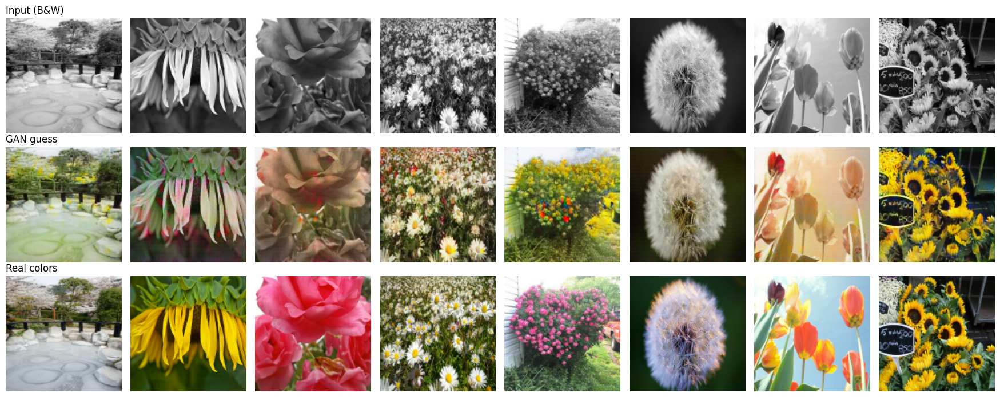


Nice work! Things to try next:
  - Train for more epochs (50, 100...) and watch the colors get bolder.
  - Try a different dataset (faces, landscapes, anime, ...).
  - Make the U-Net bigger (more filters per layer).
  - Tune L1_WEIGHT: smaller = more colorful but noisier, bigger = safer but duller.


In [4]:
# Grab a fresh batch from the test set the GAN has never trained on
gray_samples, color_samples = next(iter(test_ds))
n = min(8, gray_samples.shape[0])
gray_samples  = gray_samples[:n]
color_samples = color_samples[:n]

predicted = generator(gray_samples, training=False).numpy()

def to_display(img):
    return np.clip((img + 1) / 2, 0, 1)

fig, axes = plt.subplots(3, n, figsize=(2.2 * n, 7))
for i in range(n):
    axes[0, i].imshow(to_display(gray_samples[i, :, :, 0].numpy()), cmap='gray')
    axes[1, i].imshow(to_display(predicted[i]))
    axes[2, i].imshow(to_display(color_samples[i].numpy()))
    for r in range(3):
        axes[r, i].axis('off')
axes[0, 0].set_title('Input (B&W)', loc='left')
axes[1, 0].set_title('GAN guess',    loc='left')
axes[2, 0].set_title('Real colors',  loc='left')
plt.tight_layout(); plt.show()

# Bonus: try the model on YOUR OWN black-and-white photo
# Upload a JPG/PNG, set its path below, and run this block.
your_photo_path = None   # e.g. '/content/grandpa.jpg'
if your_photo_path and os.path.exists(your_photo_path):
    raw = tf.io.read_file(your_photo_path)
    img = tf.io.decode_image(raw, channels=3, expand_animations=False)
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE), method='area')
    img = tf.cast(img, tf.float32)
    gray = (0.299 * img[..., 0:1] + 0.587 * img[..., 1:2] + 0.114 * img[..., 2:3])
    gray = (gray / 127.5) - 1.0
    pred = generator(gray[None], training=False).numpy()[0]
    fig, axes = plt.subplots(1, 2, figsize=(7, 4))
    axes[0].imshow(to_display(gray[..., 0].numpy()), cmap='gray'); axes[0].set_title('Your B&W photo'); axes[0].axis('off')
    axes[1].imshow(to_display(pred)); axes[1].set_title('GAN coloring');                              axes[1].axis('off')
    plt.show()

print('\nNice work! Things to try next:')
print('  - Train for more epochs (50, 100...) and watch the colors get bolder.')
print('  - Try a different dataset (faces, landscapes, anime, ...).')
print('  - Make the U-Net bigger (more filters per layer).')
print('  - Tune L1_WEIGHT: smaller = more colorful but noisier, bigger = safer but duller.')